# Epilepsy, real data, channel selection

Computed on December 7; real data, channel selection

In [1]:
# real data, epilepsy

# dataset: https://openneuro.org/datasets/ds003029/versions/1.0.7/download

# No, this one: https://openneuro.org/datasets/ds003029/versions/1.0.6

# /Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-jh101/ses-presurgery/ieeg/sub-jh101_ses-presurgery_task-ictal_acq-ecog_run-02_ieeg.eeg


In [2]:

# https://stackoverflow.com/questions/71543278/how-to-read-eeg-file-from-brainvision-core-data-format-in-python


In [3]:
# https://stackoverflow.com/questions/71543278/how-to-read-eeg-file-from-brainvision-core-data-format-in-python

# https://mne.tools/1.7/auto_tutorials/raw/40_visualize_raw.html

# ChatGPT

Extracting parameters from /Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-pt2/ses-presurgery/ieeg/sub-pt2_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.vhdr...
Setting channel info structure...
Reading 0 ... 313110  =      0.000 ...   313.110 secs...
<Info | 7 non-empty values
 bads: []
 ch_names: G1, G2, G3, G4, G5, G6, G7, G8, G9, G10, G13, G14, G15, G16, ...
 chs: 86 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 500.0 Hz
 meas_date: 1914-07-30 06:27:28 UTC
 nchan: 86
 projs: []
 sfreq: 1000.0 Hz
>
Effective window size : 2.048 (s)
Plotting power spectral density (dB=True).
Using matplotlib as 2D backend.


/Users/mariamannone/test2/lib/python3.10/site-packages/mne/viz/utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


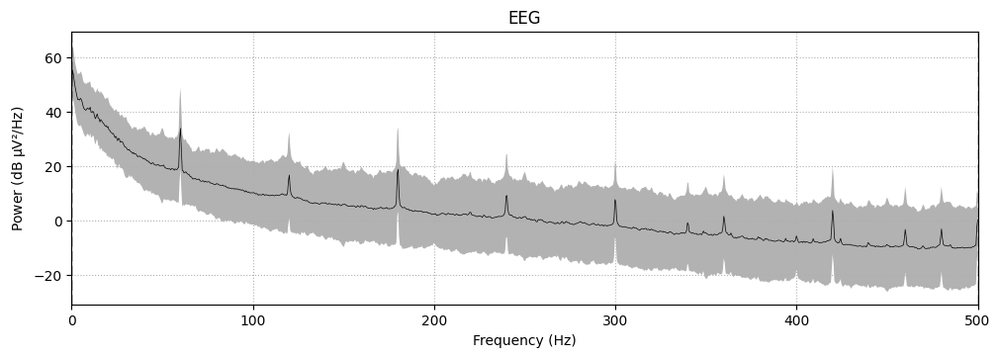

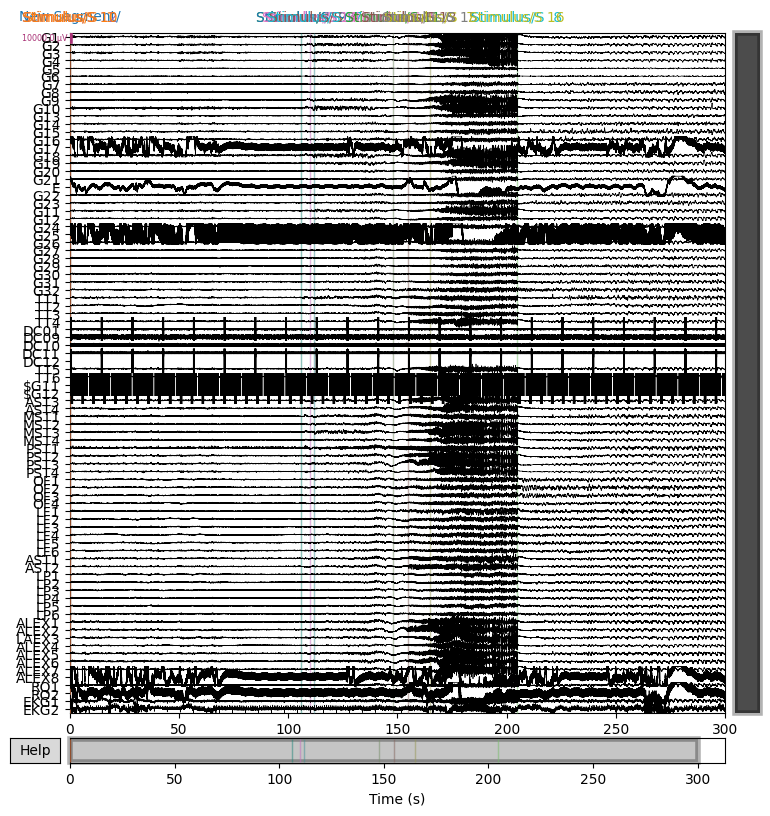

<Annotations | 18 segments: New Segment/ (1), Stimulus/S 1 (1), Stimulus/S ...>
Onset times of annotations: [  0.      0.      0.      0.    105.9   105.9   109.783 109.783 111.901
 111.901 147.907 147.907 154.967 154.967 164.851 164.851 204.74  204.74 ]
Duration of annotations: [0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.001
 0.001 0.001 0.001 0.001 0.001 0.001]
Descriptions of annotations: ['New Segment/' 'Stimulus/S  1' 'Stimulus/S 12' 'Stimulus/S 10'
 'Stimulus/S  2' 'Stimulus/S  9' 'Stimulus/S  3' 'Stimulus/S 14'
 'Stimulus/S  4' 'Stimulus/S 17' 'Stimulus/S  5' 'Stimulus/S 11'
 'Stimulus/S  6' 'Stimulus/S 13' 'Stimulus/S  7' 'Stimulus/S 15'
 'Stimulus/S  8' 'Stimulus/S 16']


In [4]:
import os
import mne
import matplotlib.pyplot as plt

# Set the path to your iEEG files
#data_path = '/Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-jh101/ses-presurgery/ieeg'
#vhdr_file = os.path.join('/Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-jh101/ses-presurgery/ieeg/sub-jh101_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.vhdr')  # Update this to your actual filename
#eeg_file = os.path.join('/Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-jh101/ses-presurgery/ieeg.eeg')  # Update this to your actual filename


data_path = '/Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-pt2/ses-presurgery/ieeg'
vhdr_file = os.path.join('/Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-pt2/ses-presurgery/ieeg/sub-pt2_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.vhdr') 
eeg_file = os.path.join('/Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-pt2/ses-presurgery/ieeg/sub-pt2_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.eeg') 

# Load EEG data using MNE
raw = mne.io.read_raw_brainvision(vhdr_file, preload=True)

# Display basic information about the dataset

print(raw.info)

#raw.plot_sensors(ch_type="eeg")

spectrum = raw.compute_psd()
spectrum.plot(average=True, picks="data", exclude="bads", amplitude=False)


# Plot the EEG data
# Option 1: Using the MNE plot function
#raw.plot(n_channels=10, scalings='auto', title='EEG Data', show=True) # 32


#raw.plot(n_channels = 132, scalings = 10e-4, title = 'EEG Data', show = True, duration = 140) # scalings = 'auto'
# duration 140


raw.plot(n_channels = 132, scalings = 50e-4, title = 'EEG Data', show = True, duration = 300) # scalings = 'auto'


# Option 2: Using Matplotlib for a custom plot
# Extract data as NumPy array


eeg_data = raw.get_data()  # Shape: (n_channels, n_samples)
num_channels = eeg_data.shape[0]

print(raw.annotations)  # View any annotations tied to the data


# Access specific fields of the annotations
print("Onset times of annotations:", raw.annotations.onset)
print("Duration of annotations:", raw.annotations.duration)
print("Descriptions of annotations:", raw.annotations.description)

# ok, so, the annotations are the time points of stimuli that the patient received

Extracting parameters from /Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-pt2/ses-presurgery/ieeg/sub-pt2_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.vhdr...
Setting channel info structure...
Reading 0 ... 313110  =      0.000 ...   313.110 secs...


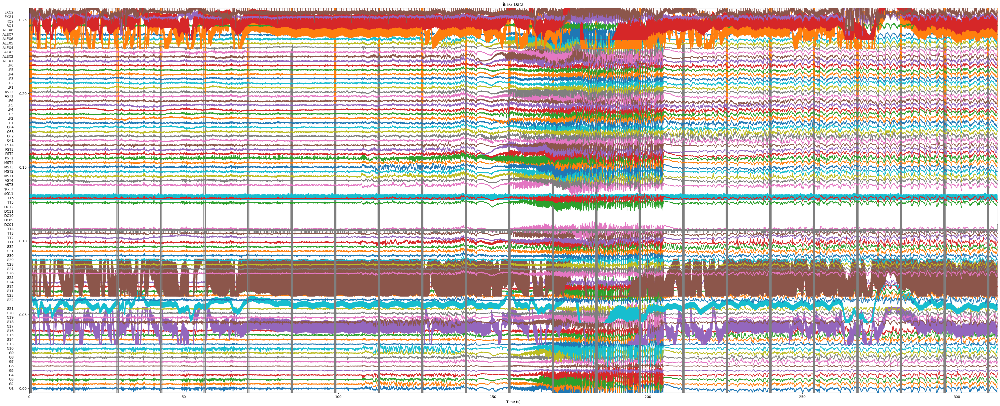

<Annotations | 18 segments: New Segment/ (1), Stimulus/S 1 (1), Stimulus/S ...>


In [5]:
import os
import mne
import matplotlib.pyplot as plt

# Set the path to your iEEG files
#data_path = '/Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-jh101/ses-presurgery/ieeg'
#vhdr_file = os.path.join(data_path, 'sub-jh101_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.vhdr')

data_path = '/Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-pt2/ses-presurgery/ieeg'
vhdr_file = os.path.join('/Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-pt2/ses-presurgery/ieeg/sub-pt2_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.vhdr') 

# Load EEG data using MNE
raw = mne.io.read_raw_brainvision(vhdr_file, preload=True)

# Extract data and time
eeg_data = raw.get_data()  # Shape: (n_channels, n_samples)
times = raw.times  # Time vector

# Create a custom plot
#plt.figure(figsize=(20, 30))  # Increase figure size for better visibility
plt.figure(figsize=(50, 20))  # Increase figure size for better visibility

n_channels = eeg_data.shape[0]
channel_names = raw.ch_names  # Get channel names

# Increase the offset for spacing
#spacing = 2e-4  # Increase this value to add more space between channels
spacing = 30e-4  # Increase this value to add more space between channels
for i in range(n_channels):
    plt.plot(times, eeg_data[i] + i * spacing)  # Offset each channel by the spacing
    # Add text annotations for channel names on the left
    plt.text(-5, i * spacing, channel_names[i], fontsize=10, verticalalignment='center', horizontalalignment='right')

plt.title('iEEG Data')
plt.xlabel('Time (s)')
#plt.ylabel('EEG Channel Signals')
#plt.xlim(0, 140)  # Adjust x-axis limit to 140 seconds
plt.xlim(0, 313.11)  # Adjust x-axis limit to 300 seconds
plt.ylim(-spacing, n_channels * spacing)  # Set y-axis limits to fit all channels
plt.savefig('iEEG_data.pdf')
plt.show()


print(raw.annotations)  # View any annotations tied to the data



Extracting parameters from /Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-pt2/ses-presurgery/ieeg/sub-pt2_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.vhdr...
Setting channel info structure...
Reading 0 ... 313110  =      0.000 ...   313.110 secs...


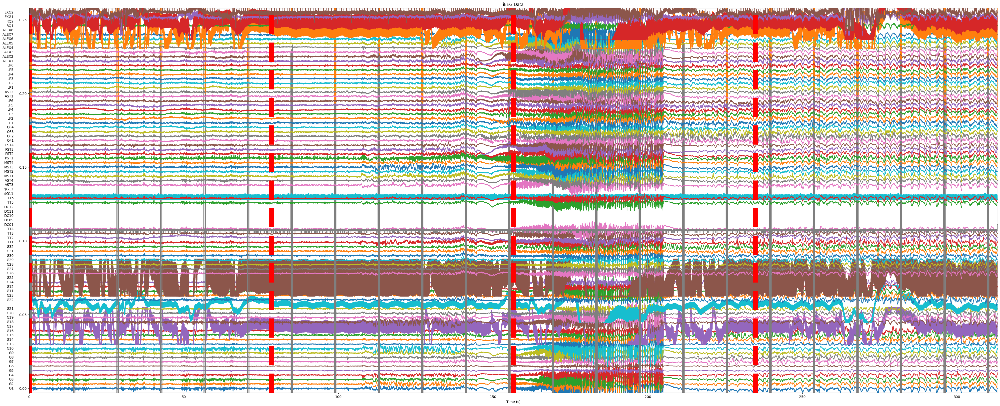

<Annotations | 18 segments: New Segment/ (1), Stimulus/S 1 (1), Stimulus/S ...>


In [14]:
import os
import mne
import matplotlib.pyplot as plt
import numpy as np

# Set the path to your iEEG files
data_path = '/Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-pt2/ses-presurgery/ieeg'
vhdr_file = os.path.join(data_path, 'sub-pt2_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.vhdr') 

# Load EEG data using MNE
raw = mne.io.read_raw_brainvision(vhdr_file, preload=True)

# Extract data and time
eeg_data = raw.get_data()  # Shape: (n_channels, n_samples)
times = raw.times  # Time vector

# Create a custom plot
plt.figure(figsize=(50, 20))  # Increase figure size for better visibility

n_channels = eeg_data.shape[0]
channel_names = raw.ch_names  # Get channel names

# Increase the offset for spacing
spacing = 30e-4  # Increase this value to add more space between channels
for i in range(n_channels):
    plt.plot(times, eeg_data[i] + i * spacing)  # Offset each channel by the spacing
    # Add text annotations for channel names on the left
    plt.text(-5, i * spacing, channel_names[i], fontsize=10, verticalalignment='center', horizontalalignment='right')

# Add vertical bars at intervals of 78.28 seconds
interval = 78.28
max_time = times[-1]
vertical_lines = np.arange(0, max_time, interval)  # Generate time points for vertical lines

for line in vertical_lines:
    plt.axvline(x=line, color='red', linestyle='--', linewidth=15)  # Customize as needed

plt.title('iEEG Data')
plt.xlabel('Time (s)')
plt.xlim(0, 313.11)  # Adjust x-axis limit to 313.11 seconds
plt.ylim(-spacing, n_channels * spacing)  # Set y-axis limits to fit all channels
plt.savefig('iEEG_data_with_vertical_bars.pdf')
plt.show()

print(raw.annotations)  # View any annotations tied to the data


In [7]:
# Find G-matrices for all channels

Extracting parameters from /Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-pt2/ses-presurgery/ieeg/sub-pt2_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.vhdr...
Setting channel info structure...
Reading 0 ... 313110  =      0.000 ...   313.110 secs...
Selected 80 channels.
1000
313.111
Segment 1:
  Duration: 78.28 seconds
  Onset: 0.00 seconds
  Ending: 78.28 seconds

Segment 2:
  Duration: 78.28 seconds
  Onset: 78.28 seconds
  Ending: 156.56 seconds

Segment 3:
  Duration: 78.28 seconds
  Onset: 156.56 seconds
  Ending: 234.83 seconds

Segment 4:
  Duration: 78.28 seconds
  Onset: 234.83 seconds
  Ending: 313.11 seconds



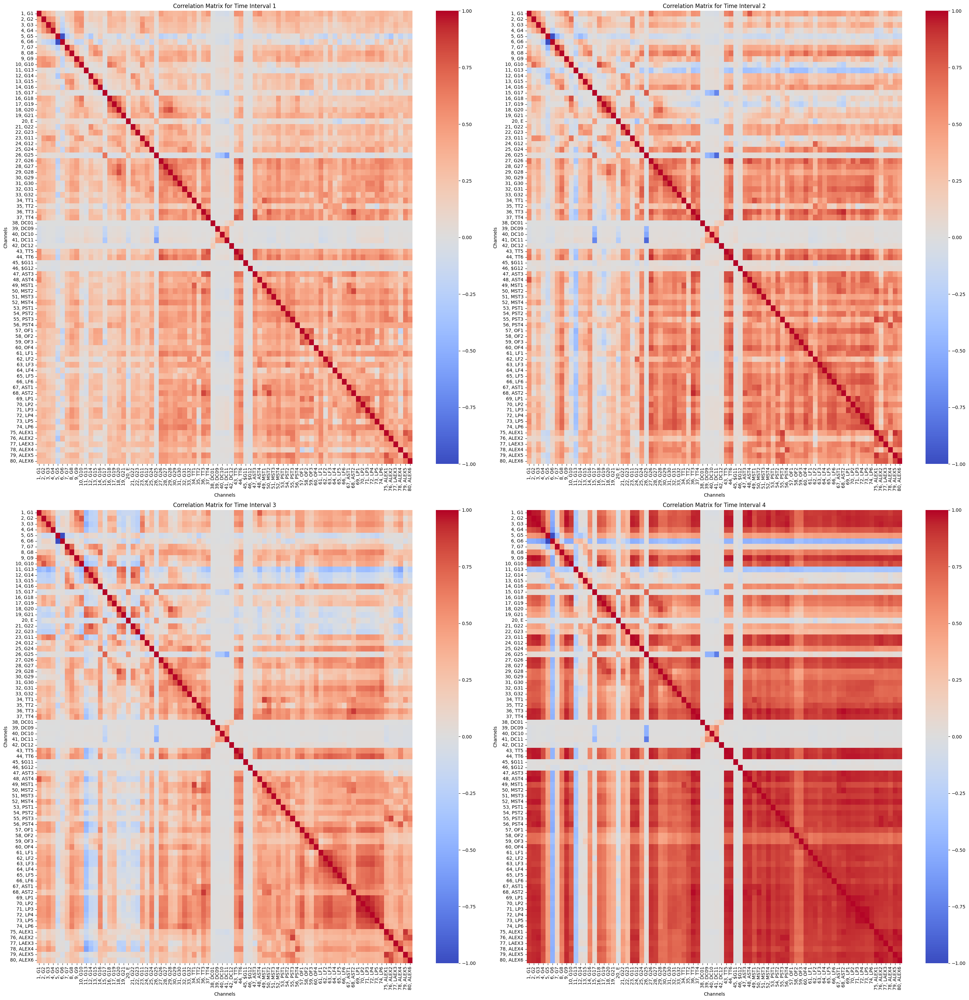

In [15]:

import os
import mne
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set the path to your iEEG files
#data_path = '/Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-jh101/ses-presurgery/ieeg'
#vhdr_file = os.path.join(data_path, 'sub-jh101_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.vhdr')

data_path = '/Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-pt2/ses-presurgery/ieeg'
vhdr_file = os.path.join('/Users/mariamannone/Desktop/new_phd_/epilepsy_data2/sub-pt2/ses-presurgery/ieeg/sub-pt2_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.vhdr') 


# Load EEG data using MNE
raw = mne.io.read_raw_brainvision(vhdr_file, preload=True)

# Extract data as NumPy array
eeg_data = raw.get_data()  # Shape: (n_channels, n_samples)
num_samples = eeg_data.shape[1]
sampling_rate = int(raw.info['sfreq'])  # Get the sampling frequency

# Select all the channels
num_selected_channels = 80 #80 #132  # Adjust this to the actual number of channels you want to use # 135
eeg_data = eeg_data[:num_selected_channels, :]  # Keep only the first 'num_selected_channels'
channel_names = raw.ch_names[:num_selected_channels]  # Get names for the selected channels
print(f"Selected {num_selected_channels} channels.")

# Calculate the total duration of the EEG data in seconds
total_duration = num_samples / sampling_rate

print(sampling_rate)
print(total_duration)

# Define the number of segments
num_segments = 4 #6 #4
segment_length = total_duration / num_segments  # Duration of each segment in seconds
segment_samples = int(segment_length * sampling_rate)  # Convert duration to samples

#####
# December 13
for i in range(num_segments):
    onset = i * segment_length  # Calculate onset time for each segment
    ending = (i + 1) * segment_length  # Calculate ending time for each segment
    print(f"Segment {i+1}:")
    print(f"  Duration: {segment_length:.2f} seconds")
    print(f"  Onset: {onset:.2f} seconds")
    print(f"  Ending: {ending:.2f} seconds")
    print()
#####

# Function to compute correlation matrices for each segment
def compute_correlation_matrices(eeg_data, num_segments, segment_samples):
    G_matrices = []
    
    for i in range(num_segments):
        start_index = i * segment_samples
        end_index = start_index + segment_samples
        
        # Handle the case where the last segment might not be a full segment
        if end_index > eeg_data.shape[1]:
            end_index = eeg_data.shape[1]
        
        segment = eeg_data[:, start_index:end_index]
        
        # Compute correlation matrix for this segment
        G = np.corrcoef(segment)
        
        G_matrices.append(G)
    
    return G_matrices

# Compute correlation matrices for the defined segments
G_matrices = compute_correlation_matrices(eeg_data, num_segments, segment_samples)

# Plot the correlation matrices as heatmaps
plt.figure(figsize=(30, 30))
for i, G in enumerate(G_matrices):
    plt.subplot(2, 2, i + 1)  # Create a 2x2 grid for the heatmaps
    #plt.subplot(6, 6, i + 1)
    sns.heatmap(G, annot=False, cmap='coolwarm', cbar=True,
                vmin=-1, vmax=1,
                xticklabels=[f'{j + 1}, {channel_names[j]}' for j in range(num_selected_channels)],
                yticklabels=[f'{j + 1}, {channel_names[j]}' for j in range(num_selected_channels)])
    plt.title(f'Correlation Matrix for Time Interval {i + 1}')
    plt.xlabel('Channels')
    plt.ylabel('Channels')

plt.tight_layout()
plt.savefig('correlation_matrices_iEEG.pdf')
plt.show()



In [9]:
# channels_of_interest = range(34, 60) # CHECK the indices of the channels we want to see here

In [10]:
# Aurora's note: TT, tutti i PST e tutti gli MST

In [16]:
# Print the list of channels' names and their numeric labels
print("Channel Names and Numeric Labels:")
for idx, name in enumerate(raw.ch_names):
    print(f"Channel {idx}: {name}")

Channel Names and Numeric Labels:
Channel 0: G1
Channel 1: G2
Channel 2: G3
Channel 3: G4
Channel 4: G5
Channel 5: G6
Channel 6: G7
Channel 7: G8
Channel 8: G9
Channel 9: G10
Channel 10: G13
Channel 11: G14
Channel 12: G15
Channel 13: G16
Channel 14: G17
Channel 15: G18
Channel 16: G19
Channel 17: G20
Channel 18: G21
Channel 19: E
Channel 20: G22
Channel 21: G23
Channel 22: G11
Channel 23: G12
Channel 24: G24
Channel 25: G25
Channel 26: G26
Channel 27: G27
Channel 28: G28
Channel 29: G29
Channel 30: G30
Channel 31: G31
Channel 32: G32
Channel 33: TT1
Channel 34: TT2
Channel 35: TT3
Channel 36: TT4
Channel 37: DC01
Channel 38: DC09
Channel 39: DC10
Channel 40: DC11
Channel 41: DC12
Channel 42: TT5
Channel 43: TT6
Channel 44: $G11
Channel 45: $G12
Channel 46: AST3
Channel 47: AST4
Channel 48: MST1
Channel 49: MST2
Channel 50: MST3
Channel 51: MST4
Channel 52: PST1
Channel 53: PST2
Channel 54: PST3
Channel 55: PST4
Channel 56: OF1
Channel 57: OF2
Channel 58: OF3
Channel 59: OF4
Channel 60

In [17]:
# TT:
#Channel 33: TT1
#Channel 34: TT2
#Channel 35: TT3
#Channel 36: TT4
#Channel 42: TT5
#Channel 43: TT6

# MST:
#Channel 48: MST1
#Channel 49: MST2
#Channel 50: MST3
#Channel 51: MST4

# PT:
#Channel 52: PST1
#Channel 53: PST2
#Channel 54: PST3
#Channel 55: PST4

# December 17
#Channel 66: AST1
#Channel 67: AST2

In [18]:
# Define the specific ranges of channels
#channels_of_interest = list(range(33, 37)) + list(range(42, 44)) + list(range(48, 52)) + list(range(52, 56))

channels_of_interest = list(range(33, 37)) + list(range(42, 44)) + list(range(48, 52)) + list(range(52, 56)) + list(range(66, 68))

In [19]:
print(channels_of_interest)

length = len(channels_of_interest)
print("Length of channels_of_interest:", length)

[33, 34, 35, 36, 42, 43, 48, 49, 50, 51, 52, 53, 54, 55, 66, 67]
Length of channels_of_interest: 16


In [20]:
for ch_index in range(length):
    print(channels_of_interest[ch_index])
    print(f'Channel {ch_index + 1}: {channels_of_interest[ch_index]}')

33
Channel 1: 33
34
Channel 2: 34
35
Channel 3: 35
36
Channel 4: 36
42
Channel 5: 42
43
Channel 6: 43
48
Channel 7: 48
49
Channel 8: 49
50
Channel 9: 50
51
Channel 10: 51
52
Channel 11: 52
53
Channel 12: 53
54
Channel 13: 54
55
Channel 14: 55
66
Channel 15: 66
67
Channel 16: 67


In [21]:
for ch_index in range(length):
    print(f'Channel {ch_index + 1}: {channels_of_interest[ch_index]}')

Channel 1: 33
Channel 2: 34
Channel 3: 35
Channel 4: 36
Channel 5: 42
Channel 6: 43
Channel 7: 48
Channel 8: 49
Channel 9: 50
Channel 10: 51
Channel 11: 52
Channel 12: 53
Channel 13: 54
Channel 14: 55
Channel 15: 66
Channel 16: 67


In [22]:
# Print the names of the corresponding channels
#for ch_index in channels_of_interest:
#    print(f'Channel {ch_index + 1}: {channel_names[ch_index]}')

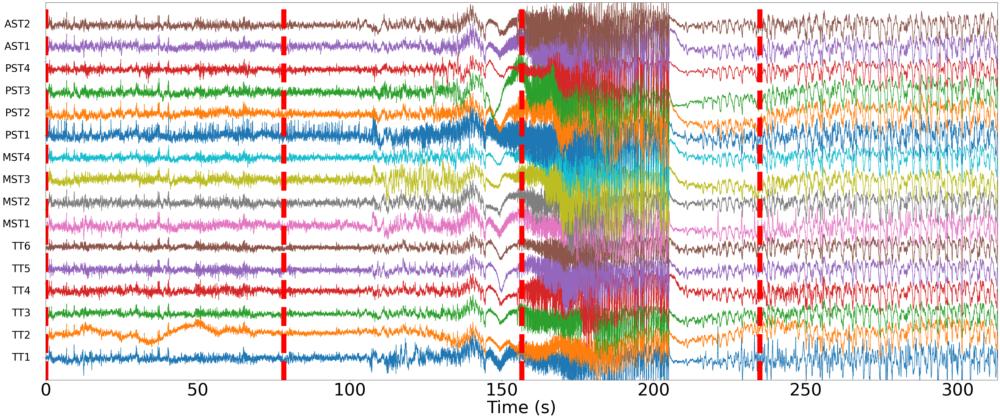

<Annotations | 18 segments: New Segment/ (1), Stimulus/S 1 (1), Stimulus/S ...>


In [23]:
import matplotlib.pyplot as plt

# List of channels of interest
#channels_of_interest = list(range(33, 37)) + list(range(42, 44)) + list(range(48, 52)) + list(range(52, 56))

# Adjust the figure size for better visualization
plt.figure(figsize=(50, 20))

# Get the total number of channels and channel names
n_channels = len(channels_of_interest)
channel_names = [raw.ch_names[i] for i in channels_of_interest]

# Increase the offset for spacing
spacing = 30e-4  # Space between channels
for i, channel_idx in enumerate(channels_of_interest):
    plt.plot(times, eeg_data[channel_idx] + i * spacing)  # Offset each channel by the spacing
    # Add text annotations for channel names on the left
    plt.text(-5, i * spacing, channel_names[i], fontsize=30, verticalalignment='center', horizontalalignment='right')

# Set plot properties
#plt.title('iEEG data for the selected channels', fontsize=34)
plt.xlabel('Time (s)', fontsize=50)
plt.xlim(0, 313.11)  # Adjust x-axis limit to 300 seconds
plt.ylim(-spacing, n_channels * spacing)  # Set y-axis limits to fit all selected channels
# Adjust tick label sizes for both axes
plt.xticks(fontsize=50)  # Set font size for x-axis ticks
plt.yticks(fontsize=0)  # Set font size for y-axis ticks

# Add vertical bars at intervals of 78.28 seconds
interval = 78.28
max_time = times[-1]
vertical_lines = np.arange(0, max_time, interval)  # Generate time points for vertical lines

for line in vertical_lines:
    plt.axvline(x=line, color='red', linestyle='--', linewidth=15)  # Customize as needed

# Save the plot as a PDF
plt.savefig('iEEG_data_selected_few_.pdf')
plt.show()

# Print the annotations tied to the data (for review)
print(raw.annotations)


In [24]:

# Adjust for zero-based indexing in Python (MNE uses zero-based indexing)

# LET'S TRY... 
# channels_of_interest = [ch - 1 for ch in channels_of_interest]

In [25]:
# Show G for the selected channels

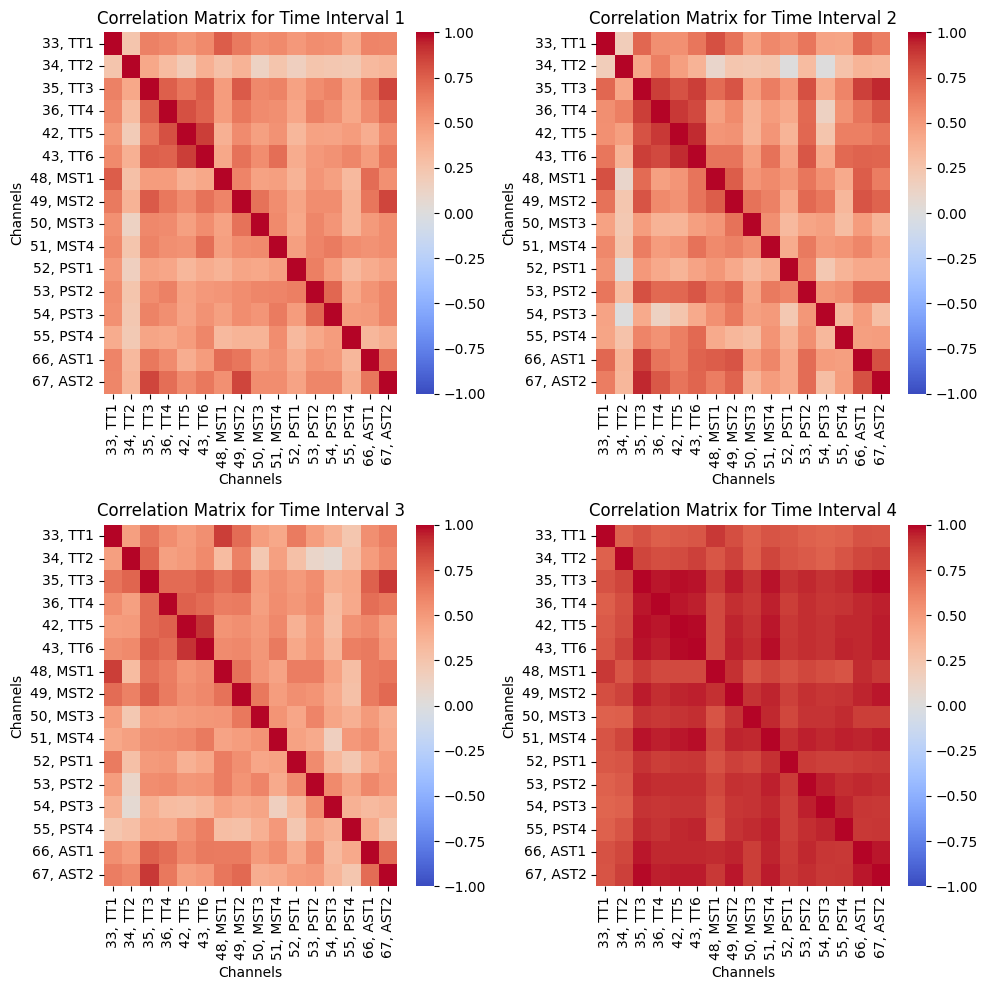

In [26]:
# Plot the correlation matrices as heatmaps
plt.figure(figsize=(10, 10))
for i, G in enumerate(G_matrices):
    plt.subplot(2, 2, i + 1)  # Create a 2x2 grid for the heatmaps
    #plt.subplot(6, 6, i + 1)
    #xticklabels = [f'{ch + 1}, {channel_names[ch]}' for ch in channels_of_interest]
    #yticklabels = [f'{ch + 1}, {channel_names[ch]}' for ch in channels_of_interest]

    #xticklabels = [f'{channel_names[ch]}' for ch in range(length)]
    #yticklabels = [f'{channel_names[ch]}' for ch in range(length)]
    xticklabels = [f'{channels_of_interest[ch]}, {channel_names[ch]}' for ch in range(length)]
    yticklabels = [f'{channels_of_interest[ch]}, {channel_names[ch]}' for ch in range(length)]

    G_subset = G[channels_of_interest, :][:, channels_of_interest]

    sns.heatmap(G_subset, annot=False, cmap='coolwarm', cbar=True,
                vmin=-1, vmax=1,
                xticklabels=xticklabels,
                yticklabels=yticklabels)
    plt.title(f'Correlation Matrix for Time Interval {i + 1}')
    plt.xlabel('Channels')
    plt.ylabel('Channels')

plt.tight_layout()
plt.savefig('correlation_matrices_iEEG_subset.pdf')
plt.show()



#for ch_index in range(length):
#    print(f'Channel {ch_index + 1}: {channel_names[ch_index]}')


K(t) Matrix:
[[1.         1.09658389 1.22965965 ... 0.90495084 0.90846274 1.25891213]
 [1.09658389 1.         1.34605938 ... 2.06292824 4.43938955 3.82459867]
 [1.22965965 1.34605938 1.         ... 1.20825445 1.26766451 1.12801279]
 ...
 [0.90495084 2.06292824 1.20825445 ... 1.         1.06004797 1.08382661]
 [0.90846274 4.43938955 1.26766451 ... 1.06004797 1.         0.87544144]
 [1.25891213 3.82459867 1.12801279 ... 1.08382661 0.87544144 1.        ]]


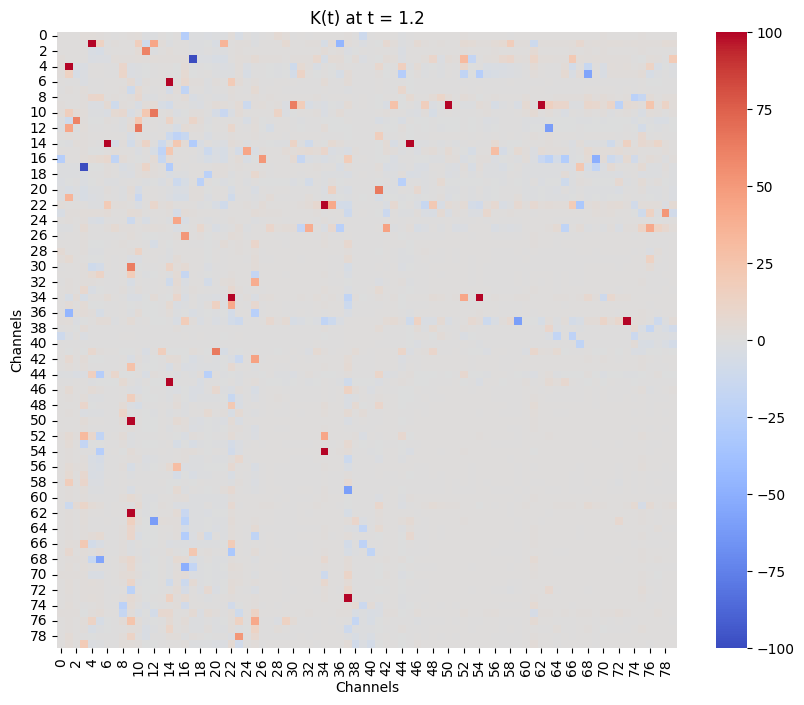

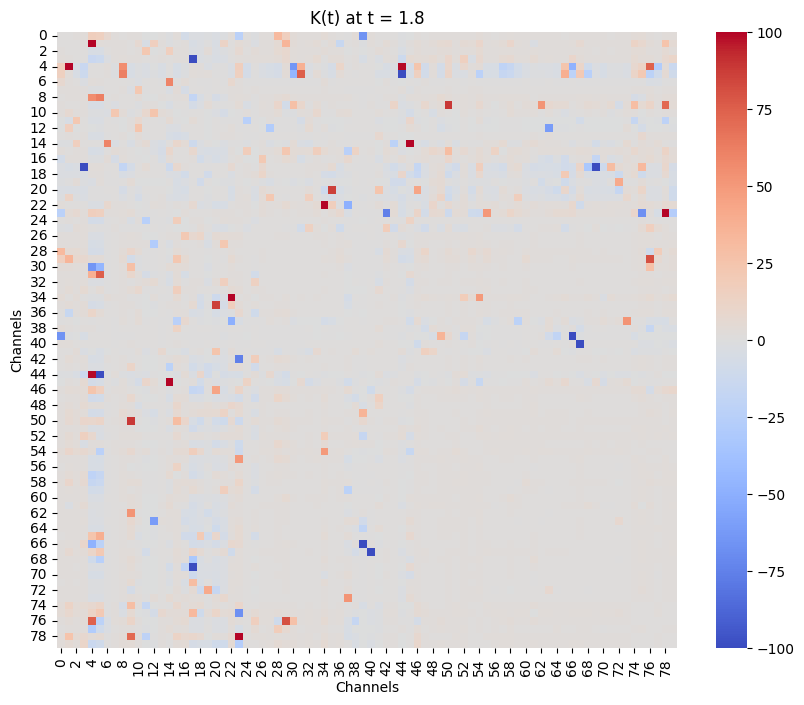

In [27]:
# Compute correlation matrices for the defined segments
G_matrices = compute_correlation_matrices(eeg_data, num_segments, segment_samples)

# Function to compute K matrices between consecutive G matrices
def compute_K(G_matrices):
    K_matrices = []
    for t in range(len(G_matrices) - 1):
        G_t0 = G_matrices[t]
        G_t1 = G_matrices[t + 1]
        K = np.zeros_like(G_t0)
        
        for i in range(G_t0.shape[0]):
            for j in range(G_t0.shape[1]):
                if G_t0[i, j] != 0:  # Avoid division by zero
                    K[i, j] = G_t1[i, j] / G_t0[i, j]
                else:
                    K[i, j] = 0  # Handle zero case appropriately
        K_matrices.append(K)
    
    return K_matrices

# Function to compute general K(t) with quadratic interpolation
def compute_general_K(t, K_matrices):
    num_channels = K_matrices[0].shape[0]
    K_t = np.zeros((num_channels, num_channels))  # Initialize the K(t) matrix

    for i in range(num_channels):  # For each row
        for j in range(num_channels):  # For each column
            K_values = [K_matrices[k][i, j] for k in range(len(K_matrices))]
            
            # Create a formula for the ij-th element of K(t) using quadratic interpolation
            if len(K_values) >= 3:  # Ensure we have enough data points for a quadratic fit
                coefficients = np.polyfit(range(len(K_values)), K_values, 2)
                K_t[i, j] = coefficients[0] * t**2 + coefficients[1] * t + coefficients[2]
            else:
                K_t[i, j] = K_values[0]  # If there's not enough data, return the first value

    return K_t

# Compute K matrices
K_matrices = compute_K(G_matrices)

# Choose a specific t value (0 to 3 for segments)
t_value = 1.2
K_t = compute_general_K(t_value, K_matrices)

# Print K(t) as a 32x32 matrix
print("K(t) Matrix:")
print(K_t)

# Create a heatmap of K(t)
plt.figure(figsize=(10, 8))
sns.heatmap(K_t, annot=False, cmap='coolwarm', cbar=True, vmin=-100, vmax=100)
plt.title(f'K(t) at t = {t_value}')
plt.xlabel('Channels')
plt.ylabel('Channels')
plt.savefig('correlation_matrices_iEEG_12.pdf')
plt.show()

# Another one
t_value = 1.8
K_t = compute_general_K(t_value, K_matrices)

# Create a heatmap of K(t)
plt.figure(figsize=(10, 8))
sns.heatmap(K_t, annot=False, cmap='coolwarm', cbar=True, vmin=-100, vmax=100)
plt.title(f'K(t) at t = {t_value}')
plt.xlabel('Channels')
plt.ylabel('Channels')
plt.savefig('correlation_matrices_iEEG_34.pdf')
plt.show()

In [28]:
# for the restricted selection:


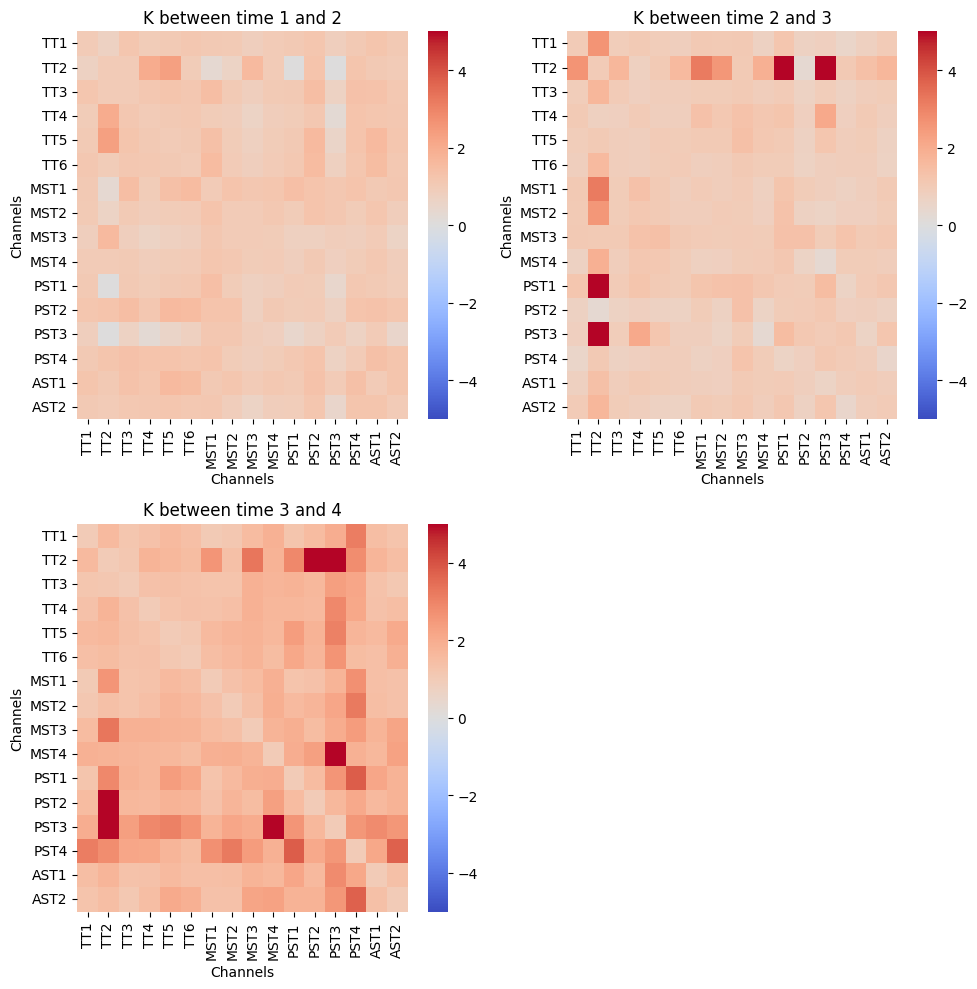

In [29]:
# Compute correlation matrices for the defined segments
G_matrices = compute_correlation_matrices(eeg_data, num_segments, segment_samples)

# Function to compute K matrices between consecutive G matrices
def compute_K(G_matrices):
    K_matrices = []
    for t in range(len(G_matrices) - 1):
        G_t0 = G_matrices[t][np.ix_(selected_channels, selected_channels)]
        G_t1 = G_matrices[t + 1][np.ix_(selected_channels, selected_channels)]
        K = np.zeros_like(G_t0)
        
        for i in range(G_t0.shape[0]):
            for j in range(G_t0.shape[1]):
                if G_t0[i, j] != 0:  # Avoid division by zero
                    K[i, j] = G_t1[i, j] / G_t0[i, j]
                else:
                    K[i, j] = 0  # Handle zero case appropriately
        K_matrices.append(K)
    
    return K_matrices

plt.figure(figsize=(10, 10))
for i, K in enumerate(K_matrices):
    plt.subplot(2, 2, i + 1)  # Create a 2x2 grid for the heatmaps

    # Labels for selected channels
    #xticklabels = [f'{ch + 1}, {channel_names[ch]}' for ch in channels_of_interest]
    #yticklabels = [f'{ch + 1}, {channel_names[ch]}' for ch in channels_of_interest]
    xticklabels = [f'{channel_names[ch]}' for ch in range(length)]
    yticklabels = [f'{channel_names[ch]}' for ch in range(length)]

    # Subset the K matrix to include only the rows and columns for the selected channels
    #K_subset = K[np.ix_(channels_of_interest, channels_of_interest)]
    K_subset = K[channels_of_interest, :][:, channels_of_interest]
    
    # Plot the heatmap for the subset of the K matrix
    sns.heatmap(K_subset, annot=False, cmap='coolwarm', cbar=True,
                vmin=-5, vmax=5,
                xticklabels=xticklabels,
                yticklabels=yticklabels)
    plt.title(f'K between time {i+1} and {i + 2}')
    plt.xlabel('Channels')
    plt.ylabel('Channels')

plt.tight_layout()
plt.savefig('K_matrices_12_23_34_iEEG_selected_channels.pdf')
plt.show()

#print(K_matrices)

In [30]:
# I will try to make some changes to the strategy to compute the general K(t).
# I am afraid that the K_matrices are only computed locally, and not stored globally.
# No, maybe ok, they are stored

In [31]:
# time-dependent K

In [32]:

# Function to compute general K(t) with quadratic interpolation
def compute_general_K(t, K_matrices):
    num_channels = K_matrices[0].shape[0]
    K_t = np.zeros((num_channels, num_channels))  # Initialize the K(t) matrix

    for i in range(num_channels):  # For each row
        for j in range(num_channels):  # For each column
            K_values = [K_matrices[k][i, j] for k in range(len(K_matrices))]
            
            # Create a formula for the ij-th element of K(t) using quadratic interpolation
            if len(K_values) >= 3:  # Ensure we have enough data points for a quadratic fit
                coefficients = np.polyfit(range(len(K_values)), K_values, 2)
                K_t[i, j] = coefficients[0] * t**2 + coefficients[1] * t + coefficients[2]

                    
                # 
                # coefficients = np.polyfit(range(len(G_values)), G_values, 1)
                # G_t[i, j] = coefficients[0] * t + coefficients[1]
                
            else:
                K_t[i, j] = K_values[0]  # If there's not enough data, return the first value
                

    return K_t



In [34]:
# SYMBOLIC, restricted to the channels of our interest



from sympy import symbols, simplify

def compute_symbolic_K_subset(K_matrices, channels_of_interest, channel_names):
    num_channels = len(channels_of_interest)
    t = symbols('t')  # Symbolic variable t
    symbolic_K_subset = [[None for _ in range(num_channels)] for _ in range(num_channels)]  # Subset K(t) matrix

    for row_idx, i in enumerate(channels_of_interest):  # Restrict rows to channels of interest
        for col_idx, j in enumerate(channels_of_interest):  # Restrict columns to channels of interest
            K_values = [K_matrices[k][i, j] for k in range(len(K_matrices))]
            
            # Fit a quadratic polynomial for the ij-th element if enough data is available
            if len(K_values) >= 3:
                coefficients = np.polyfit(range(len(K_values)), K_values, 2)
                a, b, c = coefficients
                symbolic_K_subset[row_idx][col_idx] = simplify(a * t**2 + b * t + c)
            else:
                # Use the first value as a constant if insufficient data
                symbolic_K_subset[row_idx][col_idx] = simplify(K_values[0])

    return symbolic_K_subset


In [35]:
# Compute the symbolic K(t)
symbolic_K_subset = compute_symbolic_K_subset(K_matrices, channels_of_interest, channel_names)

# Print the symbolic K(t)
for row in symbolic_K_subset:
    print(row)


[-3.38787558898545e-16*t**2 + 8.93712295169018e-16*t + 1.0, -1.47051972439443*t**2 + 3.36381037757359*t + 0.726872229502153, 0.265210372677711*t**2 - 0.526783456125063*t + 1.18630558875935, 0.130668623980938*t**2 - 0.0622446123170508*t + 0.947388387855229, 0.421287760835811*t**2 - 0.574244641758683*t + 1.05199732528862, 0.456216545572641*t**2 - 0.765291347718096*t + 1.14116750296182, -0.029493011577674*t**2 + 0.0400509832892233*t + 1.06239923041033, 0.0687004836596251*t**2 - 0.0825098486808057*t + 1.05057885650228, 0.140188703731974*t**2 + 0.0762073772753009*t + 0.839237172843754, 0.691949695188883*t**2 - 0.96631376608964*t + 1.0104086090628, -0.0476326964561588*t**2 + 0.177262303205924*t + 1.05752205086775, 0.628101309496368*t**2 - 1.07012989623123*t + 1.17382609729748, 0.584772161982917*t**2 - 0.601908105744982*t + 0.836402768224841, 1.57599801228013*t**2 - 2.12192964546283*t + 1.08588125323201, 0.567719003517827*t**2 - 1.01667046158785*t + 1.21177331587614, 0.172904009783355*t**2 - 

In [36]:
# substituting with sine, cosine, exponential, when feasible:

from sympy import exp, sin, cos, latex, symbols, simplify

def substitute_polynomials_with_functions(symbolic_K_subset, t):
    substituted_K = []
    for row in symbolic_K_subset:
        substituted_row = []
        for entry in row:
            if entry is None:
                substituted_row.append(None)
                continue

            # Check if the entry is quadratic and replace it with an exponential or sine
            entry = simplify(entry)
            if entry.as_poly(t) and entry.as_poly(t).degree() == 2:
                # Replace quadratic with an exponential, e.g., a*t^2 + b*t + c -> a*exp(b*t) + c
                coeffs = entry.as_poly(t).all_coeffs()  # Get coefficients [a, b, c]
                a, b, c = coeffs[0], coeffs[1], coeffs[2]
                substituted_row.append(simplify(a * exp(b * t) + c))
            elif entry.as_poly(t) and entry.as_poly(t).degree() == 1:
                # Replace linear with sine, e.g., a*t + b -> a*sin(b*t)
                coeffs = entry.as_poly(t).all_coeffs()  # Get coefficients [a, b]
                a, b = coeffs[0], coeffs[1]
                substituted_row.append(simplify(a * sin(b * t)))
            else:
                # Leave the entry as is if no matching pattern
                substituted_row.append(entry)

        substituted_K.append(substituted_row)
    return substituted_K



In [37]:
def print_symbolic_K_in_latex(symbolic_K_subset):
    latex_rows = []
    for row in symbolic_K_subset:
        latex_row = " & ".join([latex(entry) if entry is not None else "0" for entry in row]) + r" \\"
        latex_rows.append(latex_row)

    # Combine rows into a LaTeX matrix
    latex_matrix = r"\begin{bmatrix}" + "\n".join(latex_rows) + r"\end{bmatrix}"
    return latex_matrix


In [38]:
# Symbolic variable t
t = symbols('t')

# Compute the symbolic K(t) with polynomial substitution
substituted_K_subset = substitute_polynomials_with_functions(symbolic_K_subset, t)

# Print the symbolic K(t) in LaTeX format
latex_matrix = print_symbolic_K_in_latex(substituted_K_subset)
print("LaTeX Representation of K(t):")
print(latex_matrix)

# Save the LaTeX matrix to a file if needed
with open('K_t_latex_output.tex', 'w') as f:
    f.write(latex_matrix)


LaTeX Representation of K(t):
\begin{bmatrix}1.0 - 3.38787558898545 \cdot 10^{-16} e^{8.93712295169018 \cdot 10^{-16} t} & 0.726872229502153 - 1.47051972439443 e^{3.36381037757359 t} & 1.18630558875935 + 0.265210372677711 e^{- 0.526783456125063 t} & 0.947388387855229 + 0.130668623980938 e^{- 0.0622446123170508 t} & 1.05199732528862 + 0.421287760835811 e^{- 0.574244641758683 t} & 1.14116750296182 + 0.456216545572641 e^{- 0.765291347718096 t} & 1.06239923041033 - 0.029493011577674 e^{0.0400509832892233 t} & 1.05057885650228 + 0.0687004836596251 e^{- 0.0825098486808057 t} & 0.140188703731974 e^{0.0762073772753009 t} + 0.839237172843754 & 1.0104086090628 + 0.691949695188883 e^{- 0.96631376608964 t} & 1.05752205086775 - 0.0476326964561588 e^{0.177262303205924 t} & 1.17382609729748 + 0.628101309496368 e^{- 1.07012989623123 t} & 0.836402768224841 + 0.584772161982917 e^{- 0.601908105744982 t} & 1.08588125323201 + 1.57599801228013 e^{- 2.12192964546283 t} & 1.21177331587614 + 0.567719003517827 

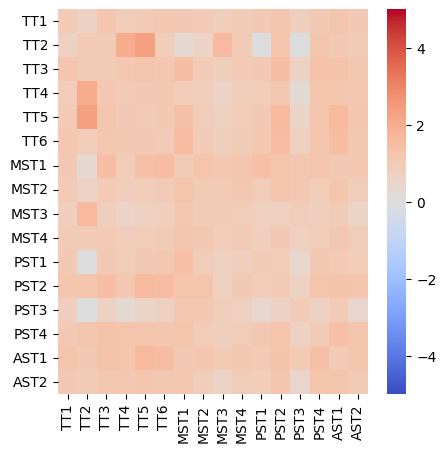

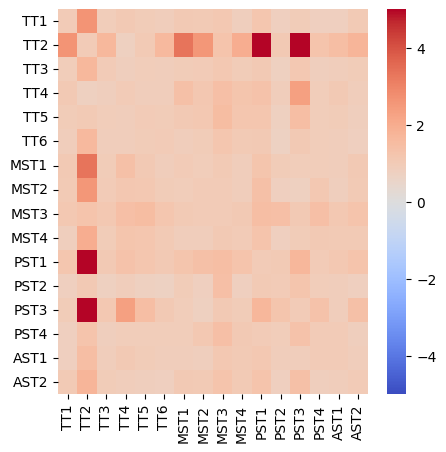

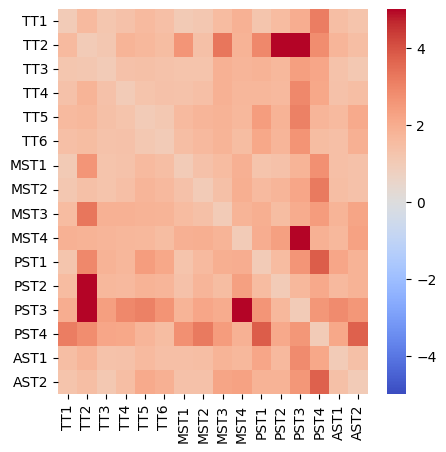

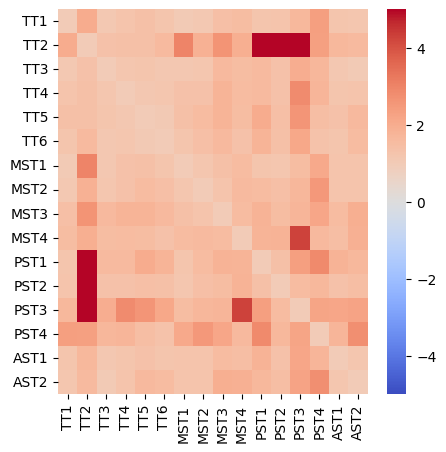

In [40]:
# With the restriction to the selected channels


# Choose a specific t value (0 to 3 for segments)
t_value = 0 # 1.2
K_t = compute_general_K(t_value, K_matrices)

# Print K(t) as a 135 x 135 matrix
#print("K(t) Matrix:")
#print(K_t)

# Create a heatmap of K(t)
plt.figure(figsize=(5, 5))
K_t_subset = K_t[channels_of_interest, :][:, channels_of_interest]
sns.heatmap(K_t_subset, annot=False, cmap='coolwarm', cbar=True, vmin=-5, vmax=5,  # viridis
            #xticklabels=[f'{ch + 1}, {channel_names[ch]}' for ch in channels_of_interest],
            #yticklabels=[f'{ch + 1}, {channel_names[ch]}' for ch in channels_of_interest])
            xticklabels=[f'{channel_names[ch]}' for ch in range(length)],
            yticklabels=[f'{channel_names[ch]}' for ch in range(length)])
#plt.title(f'heatmap of purely element-wise K(t) at t = {t_value}')
#plt.xlabel('Channels')
#plt.ylabel('Channels')
plt.savefig('test_Kt_t_0_iEEG_selected_channels.pdf')
#plt.savefig('test_Kt_t_12_iEEG_selected_channels.pdf')
plt.show()

# Another one
t_value = 1.2 #275.8 # 3.4
K_t = compute_general_K(t_value, K_matrices)

# Create a heatmap of K(t)
plt.figure(figsize=(5, 5))
K_t_subset = K_t[channels_of_interest, :][:, channels_of_interest]
sns.heatmap(K_t_subset, annot=False, cmap='coolwarm', cbar=True, vmin=-5, vmax=5,
            xticklabels=[f'{channel_names[ch]}' for ch in range(length)],
            yticklabels=[f'{channel_names[ch]}' for ch in range(length)])
#plt.title(f'heatmap of purely element-wise K(t) at t = {t_value}')
#plt.xlabel('Channels')
#plt.ylabel('Channels')
#plt.savefig('test_Kt_t_34_iEEG_selected_channels.pdf')
plt.savefig('test_Kt_t_12_iEEG_selected_channels.pdf')
plt.show()

# Another one
t_value = 2 #275.8 # 3.4
K_t = compute_general_K(t_value, K_matrices)

# Create a heatmap of K(t)
plt.figure(figsize=(5, 5))
K_t_subset = K_t[channels_of_interest, :][:, channels_of_interest]
sns.heatmap(K_t_subset, annot=False, cmap='coolwarm', cbar=True, vmin=-5, vmax=5,
            xticklabels=[f'{channel_names[ch]}' for ch in range(length)],
            yticklabels=[f'{channel_names[ch]}' for ch in range(length)])
#plt.title(f'heatmap of purely element-wise K(t) at t = {t_value}')
#plt.xlabel('Channels')
#plt.ylabel('Channels')
#plt.savefig('test_Kt_t_34_iEEG_selected_channels.pdf')
plt.savefig('test_Kt_t_2_iEEG_selected_channels.pdf')
plt.show()


# Another one
t_value = 1.8
K_t = compute_general_K(t_value, K_matrices)

# Create a heatmap of K(t)
plt.figure(figsize=(5, 5))
K_t_subset = K_t[channels_of_interest, :][:, channels_of_interest]
sns.heatmap(K_t_subset, annot=False, cmap='coolwarm', cbar=True, vmin=-5, vmax=5,
            xticklabels=[f'{channel_names[ch]}' for ch in range(length)],
            yticklabels=[f'{channel_names[ch]}' for ch in range(length)])
#plt.title(f'heatmap of purely element-wise K(t) at t = {t_value}')
#plt.xlabel('Channels')
#plt.ylabel('Channels')
#plt.savefig('test_Kt_t_34_iEEG_selected_channels.pdf')
plt.savefig('test_Kt_t_18_iEEG_selected_channels.pdf')
plt.show()
